In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import imutils
import math

In [42]:
def check_intersection(contour1, contour2):
    """
    Проверяет пересечение двух контуров.

    :param contour1: Первый контур.
    :param contour2: Второй контур.
    :return: True, если есть пересечение, иначе False.
    """
    if len(contour1) == 0 or len(contour2) == 0:
        return False

    # Преобразуем контуры в выпуклые оболочки
    hull1 = cv2.convexHull(contour1.astype(np.float32))
    hull2 = cv2.convexHull(contour2.astype(np.float32))

    # Проверка пересечения выпуклых оболочек
    ret, _ = cv2.intersectConvexConvex(hull1, hull2)

    return ret > 0

def is_intersects(x1, w1, x2, w2):
    return (x1 <= x2 <= x1 + w1) or (x2 <= x1 <= x2 + w2)

def group_by_intersection_by_axis(counters, axis = 'x'):
    intersection_groups = []

    for cnt1 in counters:
        x1,y1,w1,h1 = cv2.boundingRect(cnt1)
        for cnt2 in counters:
            x2,y2,w2,h2 = cv2.boundingRect(cnt2)
            if axis == 'x':
                if is_intersects(x1, w1, x2, w2):
                    intersection_groups.append(cnt2)
            elif axis == 'y':
                if is_intersects(x1, w1, x2, w2):
                    intersection_groups.append(cnt2)

    return intersection_groups

def intersection_area(contour1, contour2):
    """
    Вычисляет площадь пересечения двух контуров.

    :param contour1: Первый контур.
    :param contour2: Второй контур.
    :return: Площадь пересечения.
    """
    # Создаем пустое изображение
    img = np.zeros((1000, 1000), dtype=np.uint8)

    # Рисуем первый контур
    cv2.fillPoly(img, [contour1.astype(np.int32)], 1)

    # Рисуем второй контур
    cv2.fillPoly(img, [contour2.astype(np.int32)], 1)

    # Считаем количество пересечений
    intersection = np.sum(img == 2)

    return intersection

def find_intersections(leftmost_contours, circle_contours):
    intersections = []

    for left_contour in leftmost_contours:
        for circle_contour in circle_contours:
            if check_intersection(left_contour, circle_contour):
                intersections.append(left_contour)
                break

    return intersections

def remove_intersections(counters, filter_counters):
  not_intersections = []

  for counter in counters:
    is_intersection = False
    for filter_counter in filter_counters:
        if check_intersection(counter, filter_counter):
            is_intersection = True
            break
    if not is_intersection:
      not_intersections.append(counter)
  return not_intersections

def get_counters_after_counter(counters, counter, axis='y'):
    """
    Возвращает контуры, находящиеся после заданного контура вдоль указанной оси.

    :param counters: Список контуров.
    :param counter: Заданный контур.
    :param axis: Ось ('x' или 'y'), вдоль которой проверяется положение контуров.
    :return: Список контуров, находящихся после заданного контура вдоль указанной оси.
    """
    # Определяем координаты заданного контура вдоль указанной оси
    if axis == 'y':
        _, y, _, h = cv2.boundingRect(counter)
        threshold = y + h
    elif axis == 'x':
        x, _, w, _ = cv2.boundingRect(counter)
        threshold = x + w
    else:
        raise ValueError("Invalid axis. Use 'x' or 'y'.")

    # Отфильтровываем контуры, которые находятся после заданного контура вдоль указанной оси
    result = []
    for cnt in counters:
        if axis == 'y':
            _, y, _, _ = cv2.boundingRect(cnt)
            if y > threshold:
                result.append(cnt)
        elif axis == 'x':
            x, _, _, _ = cv2.boundingRect(cnt)
            if x > threshold:
                result.append(cnt)

    return result

def get_counters_before_counter(counters, counter, axis='y'):
    """
    Возвращает контуры, находящиеся перед заданным контуром вдоль указанной оси.

    :param counters: Список контуров.
    :param counter: Заданный контур.
    :param axis: Ось ('x' или 'y'), вдоль которой проверяется положение контуров.
    :return: Список контуров, находящихся перед заданным контуром вдоль указанной оси.
    """
    # Определяем координаты заданного контура вдоль указанной оси
    if axis == 'y':
        _, y, _, _ = cv2.boundingRect(counter)
        threshold = y
    elif axis == 'x':
        x, _, _, _ = cv2.boundingRect(counter)
        threshold = x
    else:
        raise ValueError("Invalid axis. Use 'x' or 'y'.")

    # Отфильтровываем контуры, которые находятся перед заданным контуром вдоль указанной оси
    result = []
    for cnt in counters:
        if axis == 'y':
            _, y, _, _ = cv2.boundingRect(cnt)
            if y < threshold:
                result.append(cnt)
        elif axis == 'x':
            x, _, _, _ = cv2.boundingRect(cnt)
            if x < threshold:
                result.append(cnt)

    return result

def create_horizontal_rectangle_counter(counter, max_width_point):
    """
    Создает горизонтальный контур (прямоугольник) на основе заданного контура.

    :param counter: Заданный контур.
    :param max_width_point: Максимальная точка по ширине.
    :return: Горизонтальный контур (прямоугольник).
    """
    if len(counter) == 0:
        return np.array([], dtype=np.float32)

    # Определяем ограничивающий прямоугольник для контура
    x, y, w, h = cv2.boundingRect(counter)

    # Создаем горизонтальный контур (прямоугольник)
    horizontal_rectangle_counter = np.array([[x, y], [max_width_point, y], [max_width_point, y + h], [x, y + h]], dtype=np.float32)

    return horizontal_rectangle_counter

def intersection_length(line1_start_x, line1_end_x, line2_start_x, line2_end_x):
    # Убедимся, что координаты отрезков упорядочены
    if line1_start_x > line1_end_x:
        line1_start_x, line1_end_x = line1_end_x, line1_start_x
    if line2_start_x > line2_end_x:
        line2_start_x, line2_end_x = line2_end_x, line2_start_x

    # Найдём координаты начала и конца пересечения
    start = max(line1_start_x, line2_start_x)
    end = min(line1_end_x, line2_end_x)

    # Вычислим длину пересечения
    length = max(0, end - start)

    return length

In [43]:
def find_contour_by_y_order(contours, order=1):
    contours.sort(key=lambda contour: cv2.boundingRect(contour)[1])

    # Возвращаем контур по порядковому номеру
    if 0 < order <= len(contours):
        return contours[order - 1]
    else:
        return None

def get_image_dimensions(image):
    """
    Возвращает ширину и высоту изображения.

    :param image: Входное изображение.
    :return: Кортеж (ширина, высота).
    """
    height, width = image.shape[:2]
    return width, height

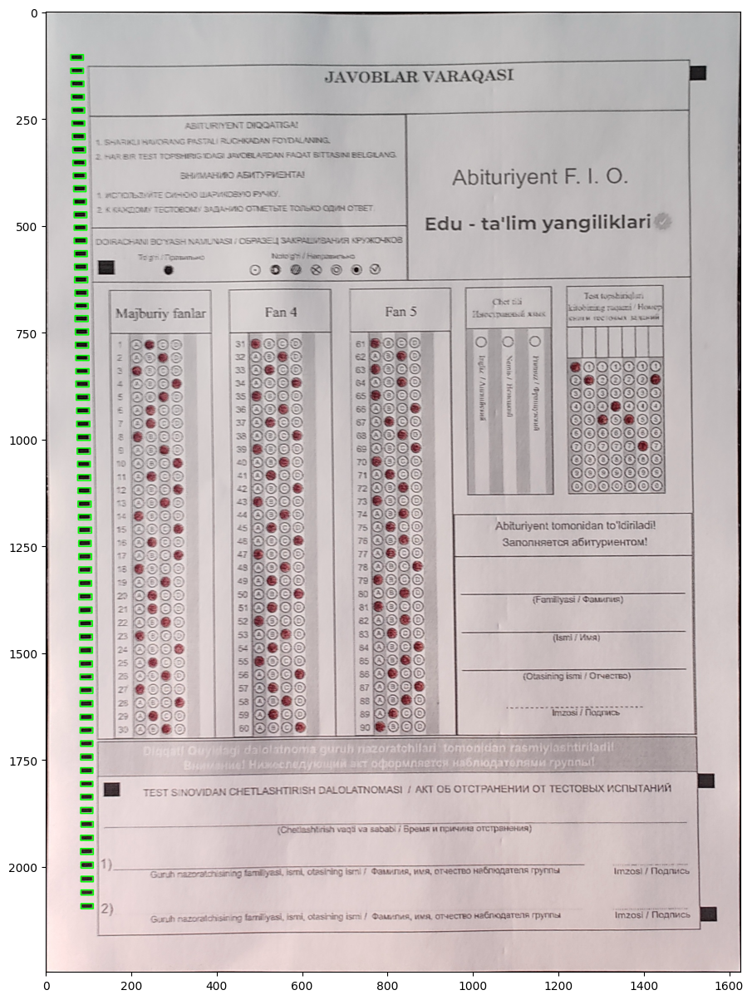

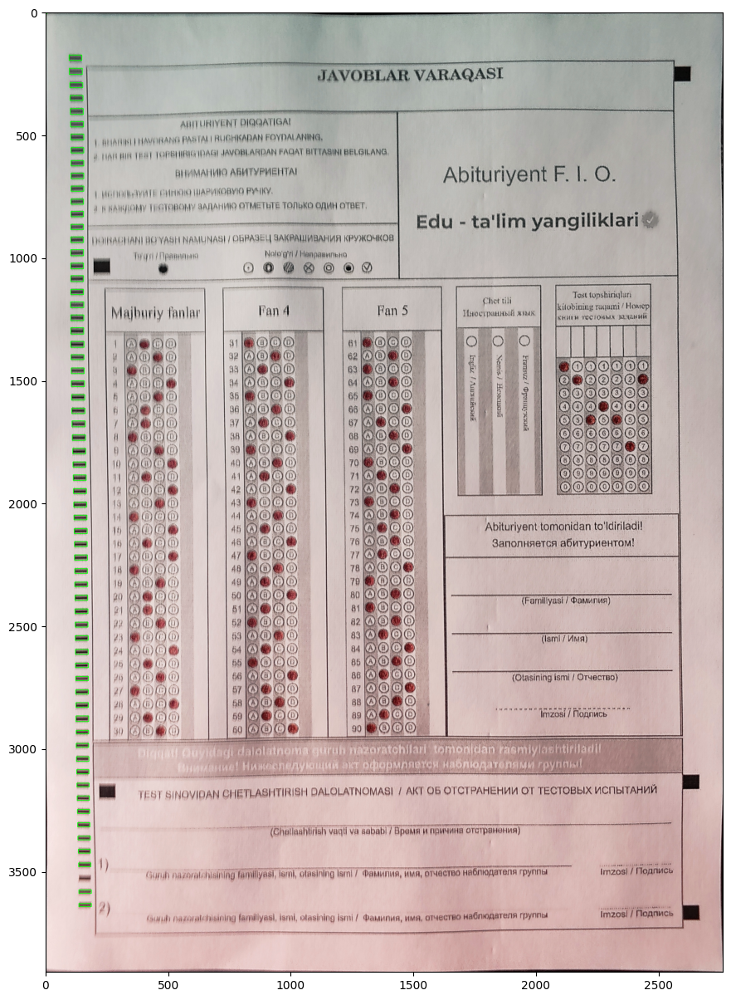

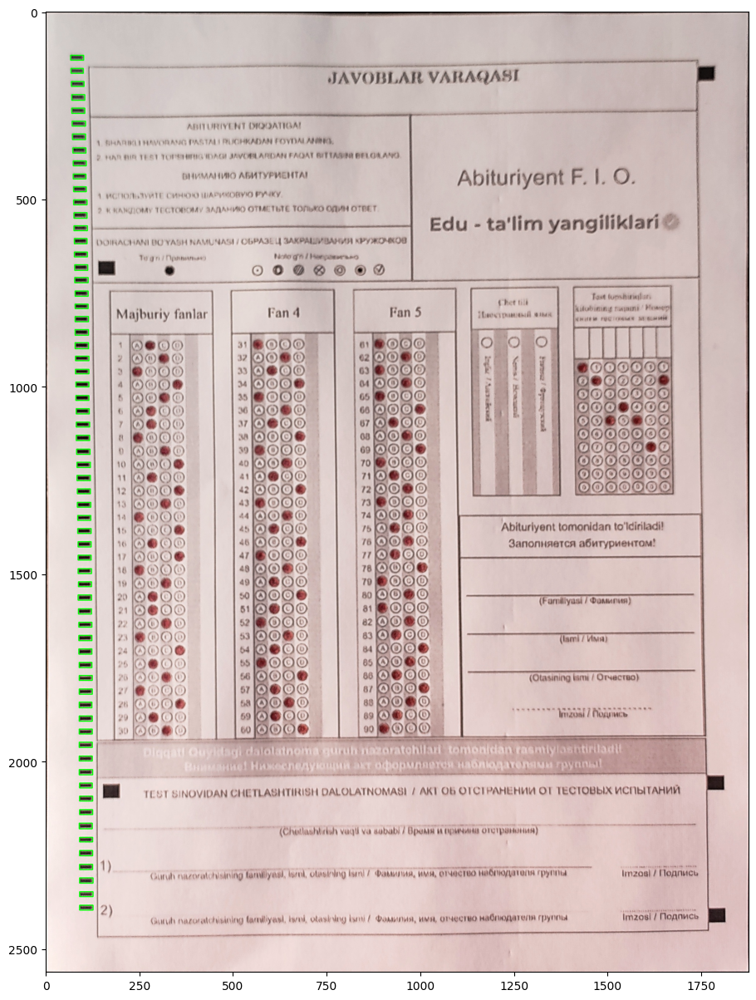

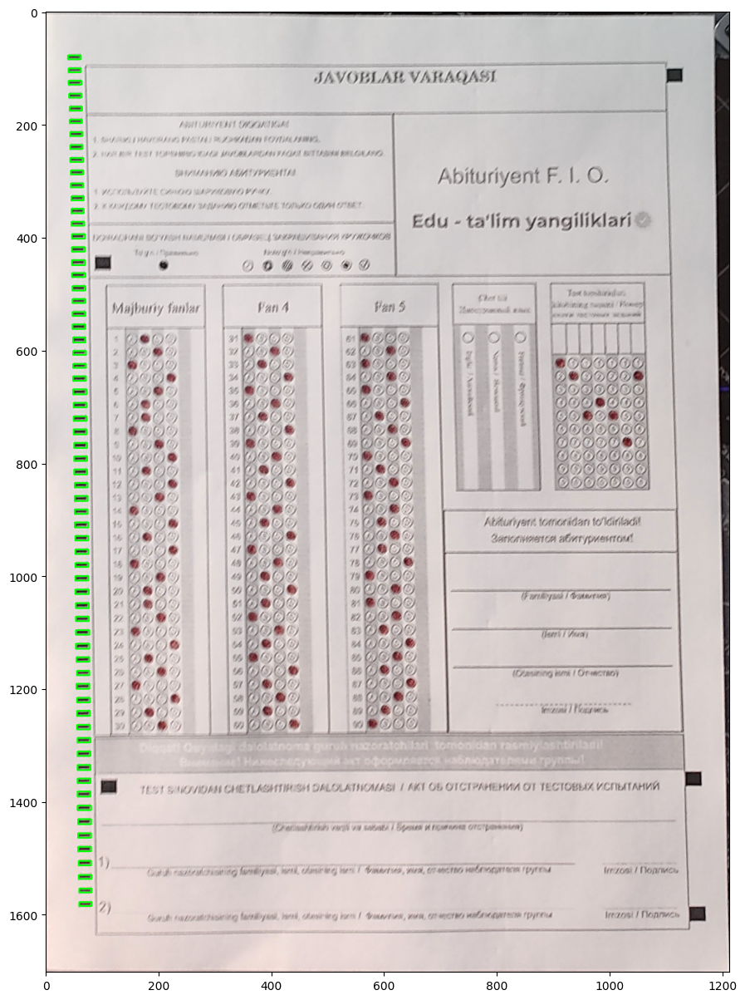

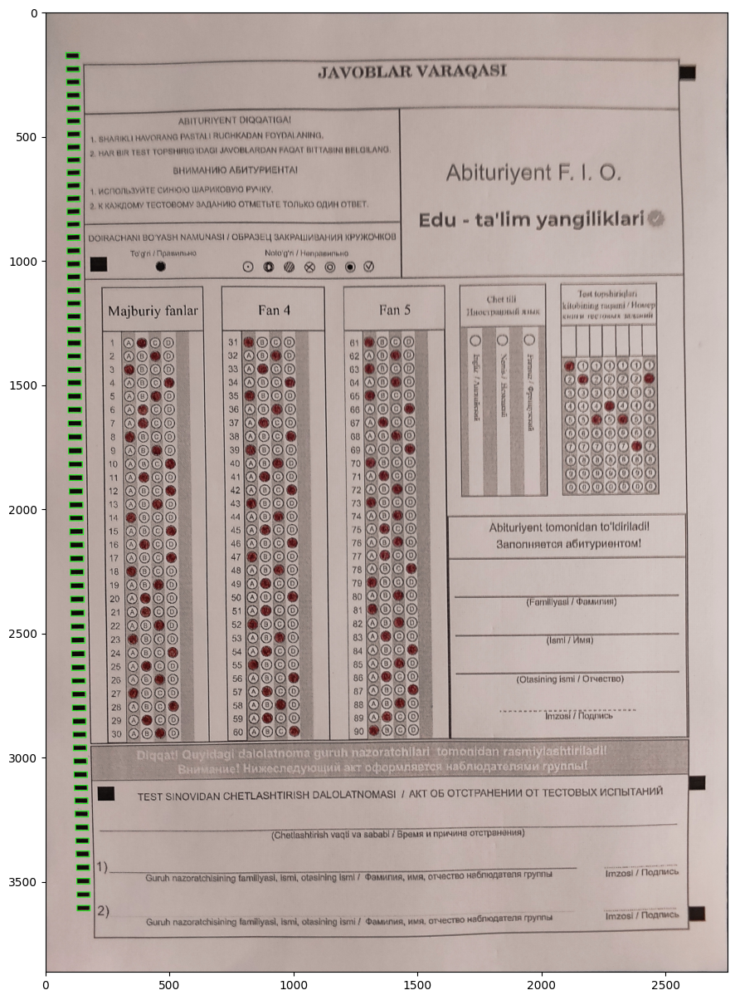

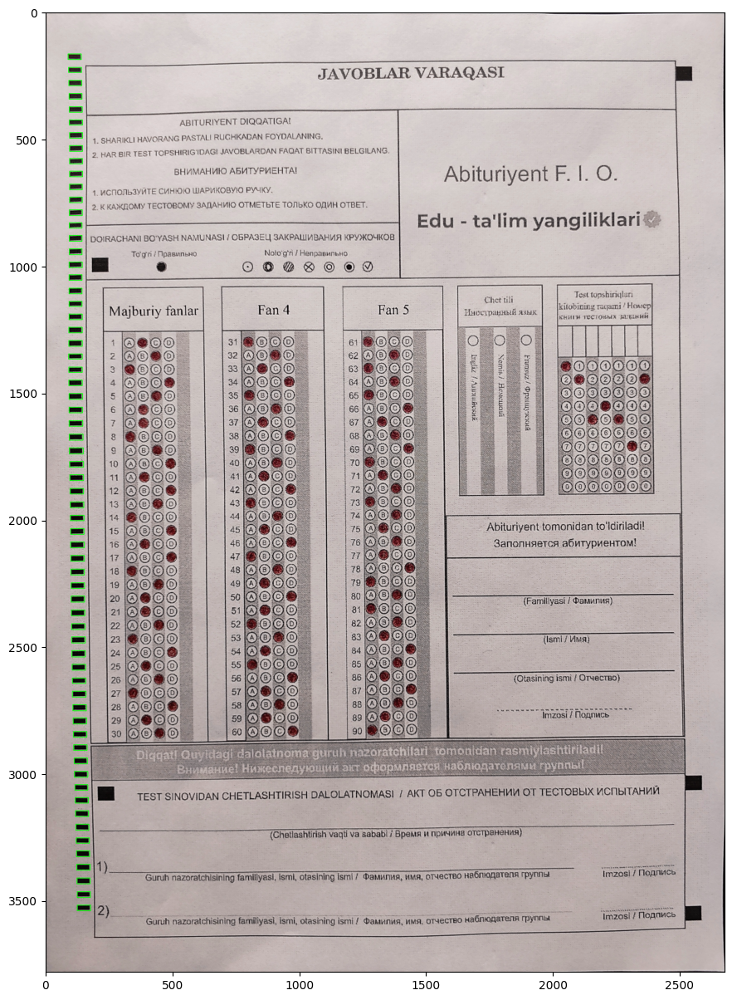

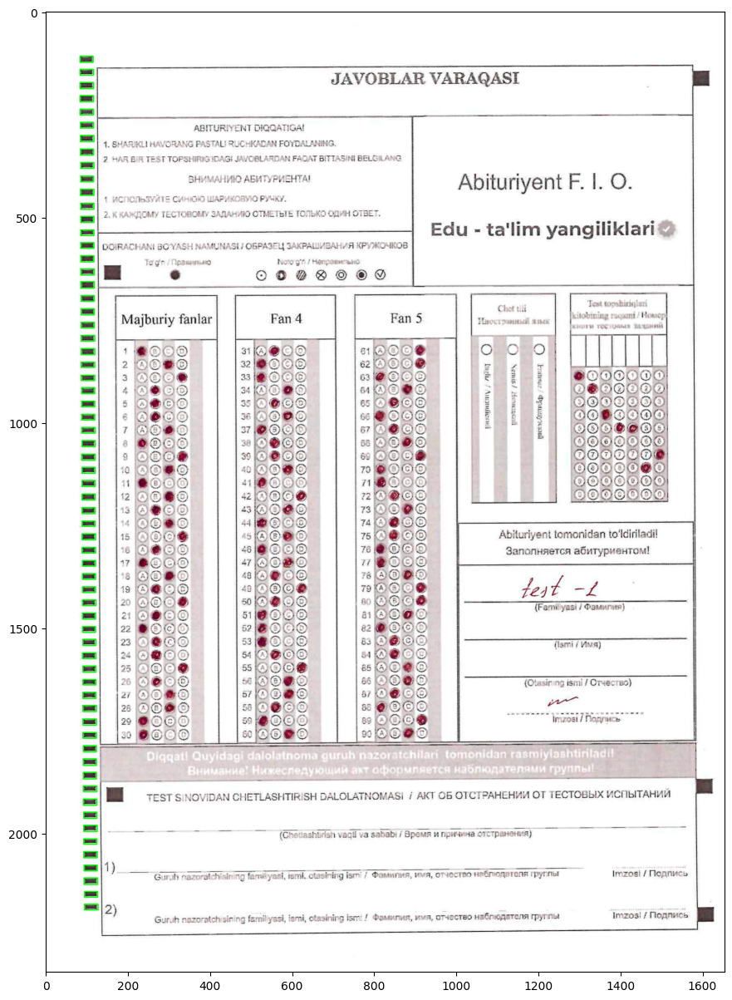

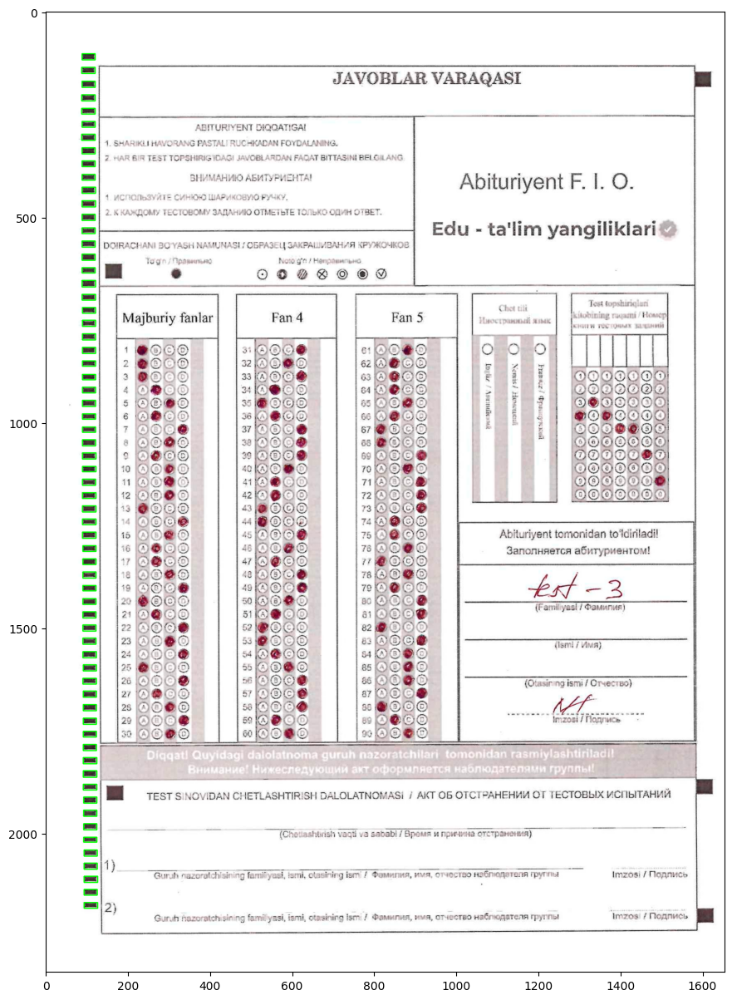

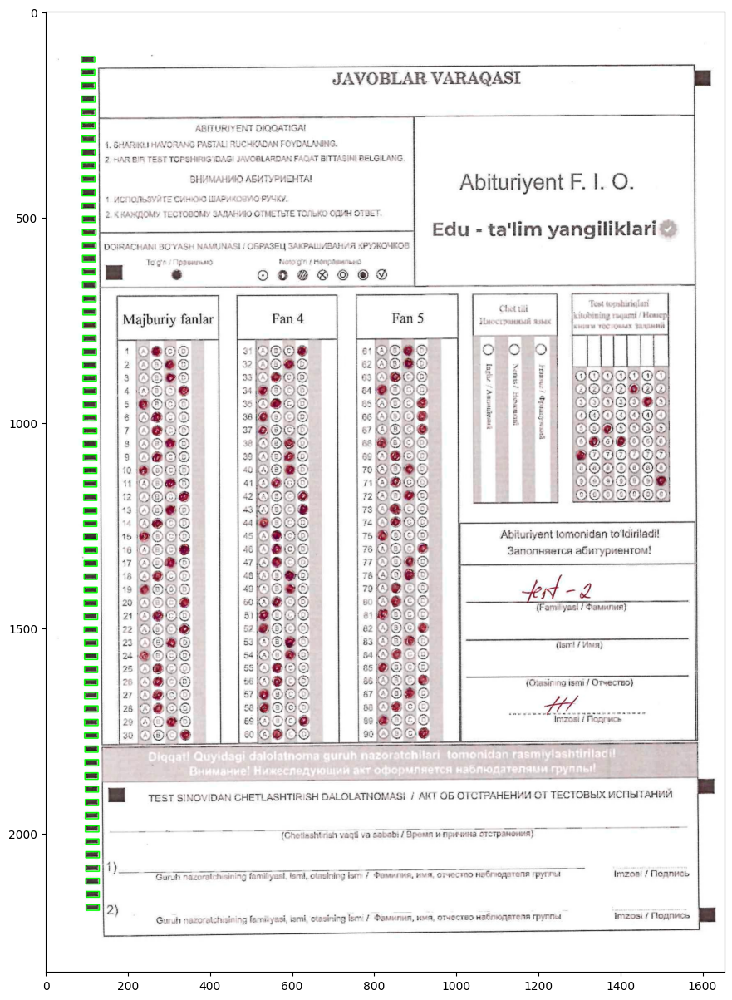

In [44]:
def find_left_counters(image, threshold_value=110, num_contours=65):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (3,3), 0)

    # Применение эрозии для улучшения видимости контуров
    kernel = np.ones((1,0), np.uint8)
    eroded = cv2.erode(gray, kernel, iterations=1)

    kernel = np.ones((0,1), np.uint8)
    eroded = cv2.erode(eroded, kernel, iterations=1)

    # Применение порогового значения для выделения объектов
    _, binary = cv2.threshold(eroded, threshold_value, 255, cv2.THRESH_BINARY_INV)

    # Поиск контуров
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Список для хранения подходящих контуров
    filtered_contours = []

    # Проход по всем найденным контурам
    for contour in contours:
        # Вычисление ограничивающего прямоугольника для каждого контура
        x, y, w, h = cv2.boundingRect(contour)

        # Проверка соотношений сторон
        if 1 < w / h < 7 : #and 10 < h < 45 and 25 < w < 65:
            filtered_contours.append(contour)

    # Сортировка контуров по координате x (самые левые)
    filtered_contours.sort(key=lambda contour: cv2.boundingRect(contour)[0])

    # Оставляем только самые левые num_contours контуров
    leftmost_contours = filtered_contours[:num_contours]

    return leftmost_contours

for i in [1,3,4,5,12,13,14,15,16]:
    image = cv2.imread(f"images/wrapped_origin/{i}.jpg")
    leftmost_contours = find_left_counters(image, 90)
    for cnt in leftmost_contours:
      (x, y, w, h) = cv2.boundingRect(cnt)
      cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    plt.figure(figsize=(20, 15))
    plt.imshow(image)

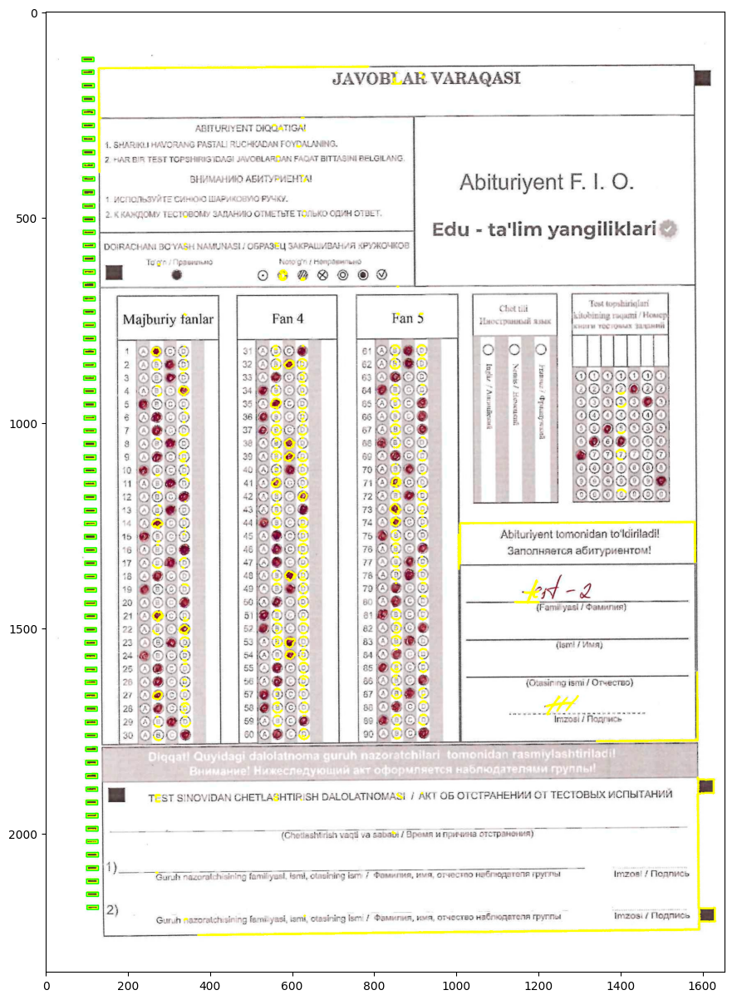

In [78]:
def get_gt_n_intersect_counters(contours, gt_n = 65, axis='x'):
    """
    Berilan axis bo'yicha gt_n martadan ortiq kesishgan konturlarni qaytaradi

    :param counters: Konturlar
    :param gt_n: axis bo'yicha kesishishlar soni
    :return: axis bo'yicha N marta kesishgan konturlar
    """
    gt_n_intersection_cnts = []
    for cnt in contours:
        x,y,w,h = cv2.boundingRect(cnt)
        intersection_count = 0
        for cnt1 in contours:
            x1,y1,w1,h1 = cv2.boundingRect(cnt1)
            if axis == 'x':
                if is_intersects(x,w,x1,w1):
                    intersection_count = intersection_count + 1
            elif axis == 'y':
                if is_intersects(y,h,y1,h1):
                    intersection_count = intersection_count + 1
        if intersection_count >= gt_n:
            gt_n_intersection_cnts.append(cnt)
    return gt_n_intersection_cnts

def filter_by_aspect_ratio(contours, min_aspect_ration = 1, max_aspect_ratio = 7):
    filtered_contours = []
    # Проход по всем найденным контурам
    for contour in contours:
        # Вычисление ограничивающего прямоугольника для каждого контура
        x, y, w, h = cv2.boundingRect(contour)
    
        # Проверка соотношений сторон
        if min_aspect_ration < w / h < max_aspect_ratio :
            filtered_contours.append(contour)
    return filtered_contours

def filter_by_area_ratio(contours, min_area_ratio = 0.4, max_area_ratio=2.5, min_area_ratio_suitable_count = 40):
    filtered_counters = []
    for cnt in contours:
        area_ratio_suitable_count = 0
        cnt_area = cv2.contourArea(cnt)
        for cnt1 in contours:
            cnt1_area = cv2.contourArea(cnt1)
            if cnt1_area != 0 and min_area_ratio <= float(cnt_area) / cnt1_area <= max_area_ratio:
                area_ratio_suitable_count = area_ratio_suitable_count + 1
        if area_ratio_suitable_count >= min_area_ratio_suitable_count:
            filtered_counters.append(cnt)
    return filtered_counters

threshold_value=100
num_contours=65

image = cv2.imread(f"images/wrapped_origin/16.jpg")


gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (3,3), 0)

# Применение эрозии для улучшения видимости контуров
kernel = np.ones((1,1), np.uint8)
eroded = cv2.erode(gray, kernel, iterations=1)


# Применение порогового значения для выделения объектов
_, binary = cv2.threshold(eroded, threshold_value, 255, cv2.THRESH_BINARY_INV)

# Поиск контуров
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Список для хранения подходящих контуров
filtered_contours = filter_by_aspect_ratio(contours)
gt_65_intersect_cnts = get_gt_n_intersect_counters(filtered_contours, 60)
cv2.drawContours(image, gt_65_intersect_cnts, -1, (255,255,0), 3)
gt_65_intersect_cnts = filter_by_area_ratio(gt_65_intersect_cnts)



# Сортировка контуров по координате x (самые левые)
filtered_contours = gt_65_intersect_cnts
filtered_contours.sort(key=lambda contour: cv2.boundingRect(contour)[0])

# Оставляем только самые левые num_contours контуров
leftmost_contours = filtered_contours[:num_contours]

for cnt in leftmost_contours:
  (x, y, w, h) = cv2.boundingRect(cnt)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

plt.figure(figsize=(20, 15))
plt.imshow(image)